In [77]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN,AgglomerativeClustering,KMeans
from sklearn.metrics import silhouette_score
import plotly.graph_objs as go
import itertools
from sklearn.preprocessing import OneHotEncoder

In [2]:
pd.set_option('display.max_rows', 10000)

In [3]:
sns.set(rc={'figure.figsize':(20,10)})
sns.set_palette("husl", 9)

In [4]:
customers_df = pd.read_csv('olist_customers_dataset.csv')
items_df = pd.read_csv('olist_order_items_dataset.csv')
payments_df = pd.read_csv('olist_order_payments_dataset.csv')
orders_df = pd.read_csv('olist_orders_dataset.csv')
products_df = pd.read_csv('olist_products_dataset.csv')
sellers_df = pd.read_csv('olist_sellers_dataset.csv')
categories_df = pd.read_csv('product_category_name_translation.csv')

In [5]:
customers_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [6]:
items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [7]:
payments_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [8]:
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [9]:
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [10]:
sellers_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [11]:
categories_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [12]:
for df in [customers_df,items_df,payments_df,orders_df,products_df,sellers_df,categories_df]:
    print(df.shape)

(99441, 5)
(112650, 7)
(103886, 5)
(99441, 8)
(32951, 9)
(3095, 4)
(71, 2)


In [13]:
for df in [customers_df,items_df,payments_df,orders_df,products_df,sellers_df,categories_df]:
    print(df.isna().any())
        

customer_id                 False
customer_unique_id          False
customer_zip_code_prefix    False
customer_city               False
customer_state              False
dtype: bool
order_id               False
order_item_id          False
product_id             False
seller_id              False
shipping_limit_date    False
price                  False
freight_value          False
dtype: bool
order_id                False
payment_sequential      False
payment_type            False
payment_installments    False
payment_value           False
dtype: bool
order_id                         False
customer_id                      False
order_status                     False
order_purchase_timestamp         False
order_approved_at                 True
order_delivered_carrier_date      True
order_delivered_customer_date     True
order_estimated_delivery_date    False
dtype: bool
product_id                    False
product_category_name          True
product_name_lenght            True
product_d

In [14]:
items_df = items_df.drop_duplicates()

Some of the dataframes appear to have NaN values in them.

In [15]:
df_raw = pd.merge(orders_df, customers_df, on='customer_id')
df_raw.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


In [16]:
items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [17]:
df_raw = df_raw.merge(items_df, on='order_id')

In [18]:
df_raw = df_raw.merge(payments_df, on='order_id')
df_raw = df_raw.merge(products_df, on='product_id')
df_raw = df_raw.merge(sellers_df, on='seller_id')
df_raw = df_raw.merge(categories_df, on='product_category_name', how='left')

In [19]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117601 entries, 0 to 117600
Data columns (total 34 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       117601 non-null  object 
 1   customer_id                    117601 non-null  object 
 2   order_status                   117601 non-null  object 
 3   order_purchase_timestamp       117601 non-null  object 
 4   order_approved_at              117586 non-null  object 
 5   order_delivered_carrier_date   116356 non-null  object 
 6   order_delivered_customer_date  115034 non-null  object 
 7   order_estimated_delivery_date  117601 non-null  object 
 8   customer_unique_id             117601 non-null  object 
 9   customer_zip_code_prefix       117601 non-null  int64  
 10  customer_city                  117601 non-null  object 
 11  customer_state                 117601 non-null  object 
 12  order_item_id                 

In [20]:
df_raw.describe()

,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix
count,117601.000000,117601.000000,117601.000000,117601.000000,117601.000000,117601.000000,117601.000000,115903.000000,115903.000000,115903.000000,117581.000000,117581.000000,117581.000000,117581.000000,117601.000000
mean,35051.793097,1.195900,120.824783,20.045990,1.093528,2.939482,172.686752,48.767590,786.950855,2.207881,2114.309497,30.257235,16.630306,23.068574,24441.423049
std,29820.588877,0.697706,184.479323,15.861315,0.726692,2.774223,267.592290,10.035011,653.036231,1.719531,3788.798201,16.190920,13.458952,11.748468,27572.632286
min,1003.000000,1.000000,0.850000,0.000000,1.000000,0.000000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,1001.000000
25%,11310.000000,1.000000,39.900000,13.080000,1.000000,1.000000,60.870000,42.000000,347.000000,1.000000,300.000000,18.000000,8.000000,15.000000,6429.000000
50%,24315.000000,1.000000,74.900000,16.290000,1.000000,2.000000,108.210000,52.000000,601.000000,1.000000,700.000000,25.000000,13.000000,20.000000,13660.000000
75%,58600.000000,1.000000,134.900000,21.190000,1.000000,4.000000,189.260000,57.000000,985.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,28035.000000
max,99990.000000,21.000000,6735.000000,409.680000,29.000000,24.000000,13664.080000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99730.000000


In [21]:
df_raw.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28 00:00:00,3a51803cc0d012c3b5dc8b7528cb05f7,3366,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15 00:00:00,ef0996a1a279c26e7ecbd737be23d235,2290,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares


In [22]:
df_raw['order_purchase_timestamp'] = df_raw['order_purchase_timestamp'].astype('datetime64')
df_raw['order_approved_at'] = df_raw['order_approved_at'].astype('datetime64')
df_raw['order_delivered_carrier_date'] = df_raw['order_delivered_carrier_date'].astype('datetime64')
df_raw['order_delivered_customer_date'] = df_raw['order_delivered_customer_date'].astype('datetime64')
df_raw['order_estimated_delivery_date'] = df_raw['order_estimated_delivery_date'].astype('datetime64')
df_raw['shipping_limit_date'] = df_raw['shipping_limit_date'].astype('datetime64')

In [23]:
for i in df_raw.select_dtypes(include = object).columns:
    x = df_raw[i].value_counts()
    print("Column: ",i,"\n",x)

Column:  order_id 
 895ab968e7bb0d5659d16cd74cd1650c    63
fedcd9f7ccdc8cba3a18defedd1a5547    38
fa65dad1b0e818e3ccc5cb0e39231352    29
ccf804e764ed5650cd8759557269dc13    26
68986e4324f6a21481df4e6e89abcf01    24
                                    ..
38cd9a16e2ee3ee519de420fc15d77ff     1
ac8f533b96ef19b111869e752c59a61c     1
8c695ffcf56400764176fd1789ec7fa2     1
90fdc874aae30f20d38d3cf1cd9161fb     1
0cc25005d4c6ad2b8ca080644cee93d8     1
Name: order_id, Length: 98665, dtype: int64
Column:  customer_id 
 270c23a11d024a44c896d1894b261a83    63
13aa59158da63ba0e93ec6ac2c07aacb    38
9af2372a1e49340278e7c1ef8d749f34    29
92cd3ec6e2d643d4ebd0e3d6238f69e2    26
d22f25a9fadfb1abbc2e29395b1239f4    24
                                    ..
bbc160254f556c214299211d347e912e     1
1d3de70085b48ac61b4c235af55b9522     1
d3125b74c9df178912c5f59dc77410fd     1
4ba06f0d95d8065031a5696bc5770ac3     1
8c026df875ce27008c74eb034ce7020d     1
Name: customer_id, Length: 98665, dtype: int64
Column: 

In [24]:
df_raw['customer_unique_id'].nunique()

95419

In [25]:
df_raw['order_id'].nunique()

98665

In [26]:
df_raw['product_id'].nunique()

32951

In [27]:
df_raw['seller_id'].nunique()

3095

Based on the above counts we can see that, there are about 95,419 unique customers. And about 32,951 products and 3,095 sellers.

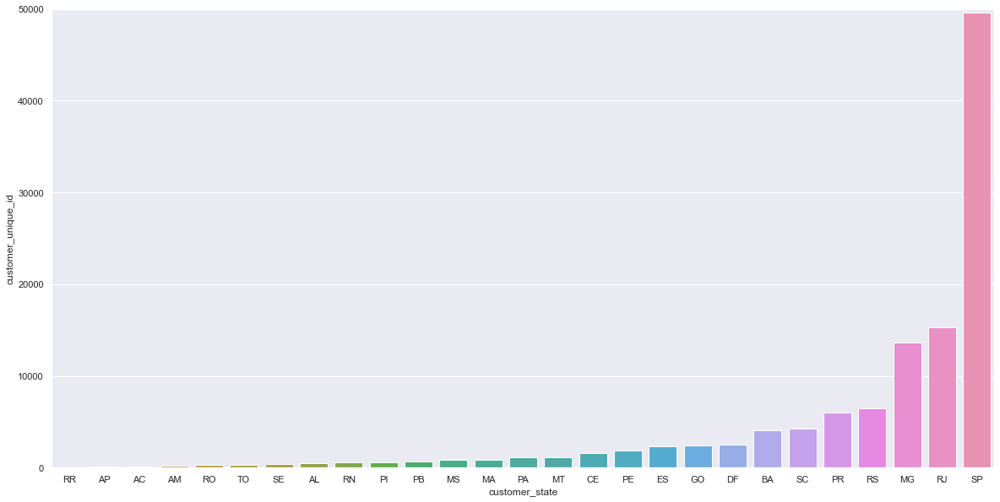

In [28]:
state = df_raw.groupby('customer_state').count().reset_index()
consumers_by_state = state.sort_values(by=['customer_unique_id'])
ax = sns.barplot(x = 'customer_state', y = 'customer_unique_id', data = consumers_by_state)
ax.set(ylim=(0, 50000))
plt.show()

Most of the customers live in Sao Paulo. Followed by Rio de Janeiro after a considerable margin.

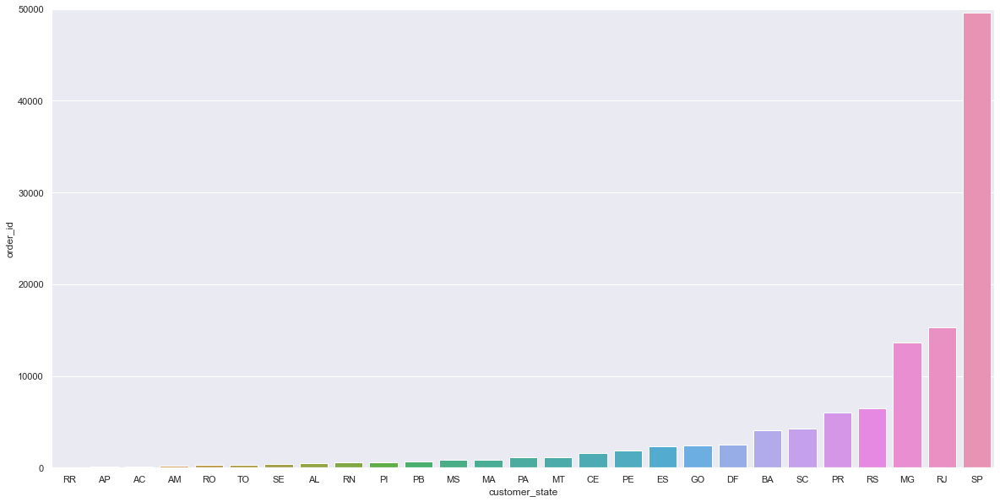

In [29]:
ax = sns.barplot(x = 'customer_state', y = 'order_id', data = consumers_by_state)
ax.set(ylim=(0, 50000))
plt.show()

It is not surprising to see that most orders are from Sao Paulo.

In [30]:
df_raw.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,3a51803cc0d012c3b5dc8b7528cb05f7,3366,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,ef0996a1a279c26e7ecbd737be23d235,2290,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares


<AxesSubplot:xlabel='product_category_name_english', ylabel='count'>

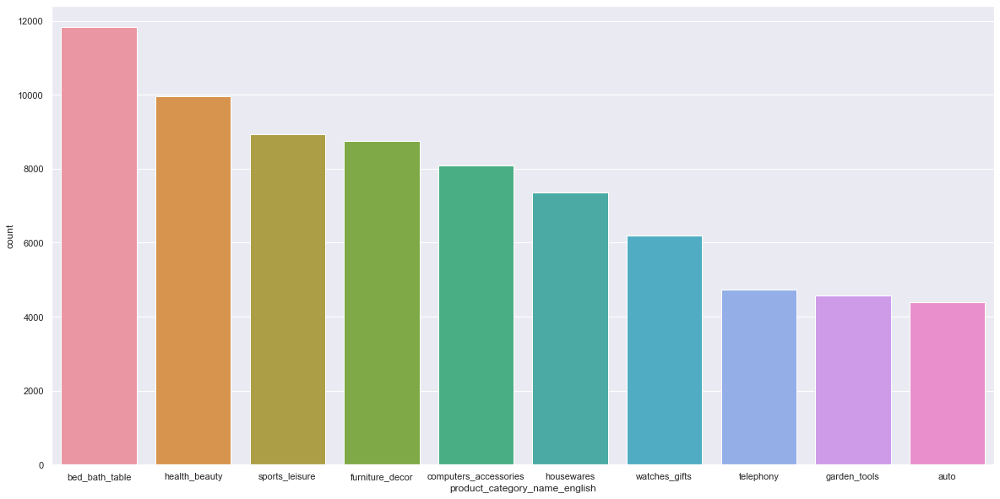

In [31]:
sns.countplot(x = 'product_category_name_english',data = df_raw, order=df_raw.value_counts('product_category_name_english').iloc[:10].index)

Most of the orders placed are from bed_bath_table category followed by health_beauty by almost 2,000. 

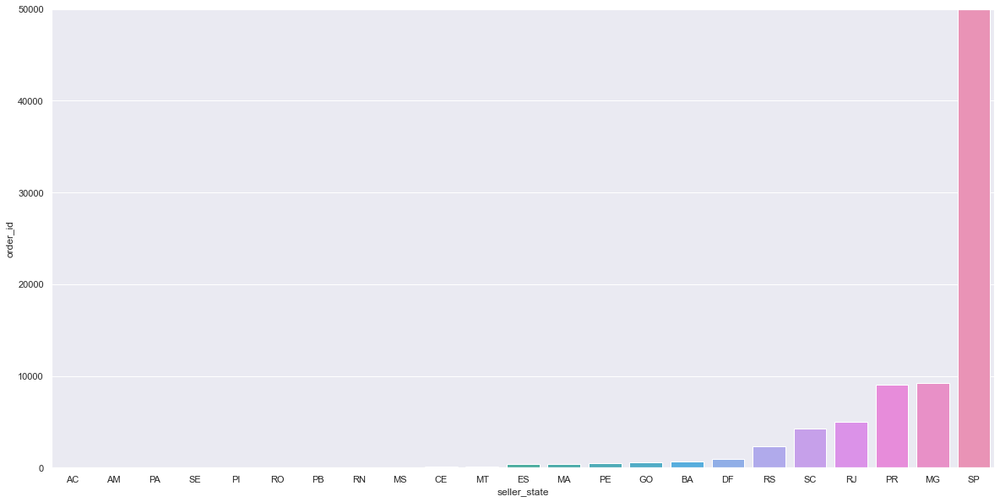

In [32]:
state = df_raw.groupby('seller_state').count().reset_index()
sellers_by_state = state.sort_values(by=['seller_id'])

ax = sns.barplot(x = 'seller_state', y = 'order_id', data = sellers_by_state)
ax.set(ylim=(0, 50000))
plt.show()

This comes as no surprise that most of the sellers are from Sao Paulo, since most of the orders are from Sao Paulo itself.

In [33]:
def to_date_column(dataframe,column:str):
    dataframe["dt_"+column] = pd.to_datetime(dataframe[column], format="%y%m%d%H")
    dataframe[column+"_year"] = dataframe["dt_"+column].dt.year
    dataframe[column+"_month"] = dataframe["dt_"+column].dt.month
    dataframe[column+"_day"] = dataframe["dt_"+column].dt.day
    dataframe[column+"_int_hour"] = dataframe["dt_"+column].dt.hour
    dataframe[column+"_is_weekday"] = dataframe["dt_"+column].dt.dayofweek
    dataframe[column+"_is_weekend"] = dataframe.apply(lambda x: x[column+"_is_weekday"] in [5, 6], axis=1)

In [34]:
df_raw.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,3a51803cc0d012c3b5dc8b7528cb05f7,3366,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,ef0996a1a279c26e7ecbd737be23d235,2290,...,268.0,4.0,500.0,19.0,8.0,13.0,9350,maua,SP,housewares


In [35]:
to_date_column(df_raw,'order_purchase_timestamp')

In [36]:
df_raw.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,seller_city,seller_state,product_category_name_english,dt_order_purchase_timestamp,order_purchase_timestamp_year,order_purchase_timestamp_month,order_purchase_timestamp_day,order_purchase_timestamp_int_hour,order_purchase_timestamp_is_weekday,order_purchase_timestamp_is_weekend
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,maua,SP,housewares,2017-10-02 10:56:33,2017,10,2,10,0,False
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,maua,SP,housewares,2017-10-02 10:56:33,2017,10,2,10,0,False
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,...,maua,SP,housewares,2017-10-02 10:56:33,2017,10,2,10,0,False
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,3a51803cc0d012c3b5dc8b7528cb05f7,3366,...,maua,SP,housewares,2017-08-15 18:29:31,2017,8,15,18,1,False
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,ef0996a1a279c26e7ecbd737be23d235,2290,...,maua,SP,housewares,2017-08-02 18:24:47,2017,8,2,18,2,False


<AxesSubplot:xlabel='order_purchase_timestamp_int_hour', ylabel='count'>

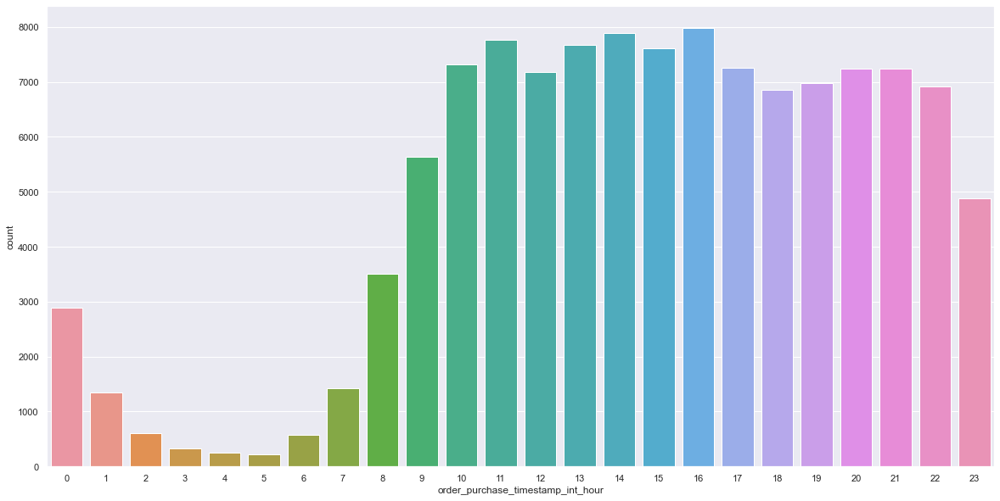

In [37]:
sns.countplot(x = 'order_purchase_timestamp_int_hour', data = df_raw)


As per the above plot, most of the orders are placed stating from 8 AM till 11 PM. While 4 PM being the most active hour.

In [38]:
df_raw.drop(['order_id','customer_id','customer_unique_id','order_item_id','product_id','seller_id','product_category_name'],axis=1,inplace=True)

In [39]:
df_raw.head()

,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_zip_code_prefix,customer_city,customer_state,shipping_limit_date,...,seller_city,seller_state,product_category_name_english,dt_order_purchase_timestamp,order_purchase_timestamp_year,order_purchase_timestamp_month,order_purchase_timestamp_day,order_purchase_timestamp_int_hour,order_purchase_timestamp_is_weekday,order_purchase_timestamp_is_weekend
0,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,3149,sao paulo,SP,2017-10-06 11:07:15,...,maua,SP,housewares,2017-10-02 10:56:33,2017,10,2,10,0,False
1,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,3149,sao paulo,SP,2017-10-06 11:07:15,...,maua,SP,housewares,2017-10-02 10:56:33,2017,10,2,10,0,False
2,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,3149,sao paulo,SP,2017-10-06 11:07:15,...,maua,SP,housewares,2017-10-02 10:56:33,2017,10,2,10,0,False
3,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,3366,sao paulo,SP,2017-08-21 20:05:16,...,maua,SP,housewares,2017-08-15 18:29:31,2017,8,15,18,1,False
4,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,2290,sao paulo,SP,2017-08-08 18:37:31,...,maua,SP,housewares,2017-08-02 18:24:47,2017,8,2,18,2,False


In [40]:
df_raw.isna().any()

order_status                           False
order_purchase_timestamp               False
order_approved_at                       True
order_delivered_carrier_date            True
order_delivered_customer_date           True
order_estimated_delivery_date          False
customer_zip_code_prefix               False
customer_city                          False
customer_state                         False
shipping_limit_date                    False
price                                  False
freight_value                          False
payment_sequential                     False
payment_type                           False
payment_installments                   False
payment_value                          False
product_name_lenght                     True
product_description_lenght              True
product_photos_qty                      True
product_weight_g                        True
product_length_cm                       True
product_height_cm                       True
product_wi

In [41]:
for col in ['order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date','shipping_limit_date']:
    to_date_column(df_raw,col)

In [42]:
df_raw.isna().any()

order_status                                False
order_purchase_timestamp                    False
order_approved_at                            True
order_delivered_carrier_date                 True
order_delivered_customer_date                True
order_estimated_delivery_date               False
customer_zip_code_prefix                    False
customer_city                               False
customer_state                              False
shipping_limit_date                         False
price                                       False
freight_value                               False
payment_sequential                          False
payment_type                                False
payment_installments                        False
payment_value                               False
product_name_lenght                          True
product_description_lenght                   True
product_photos_qty                           True
product_weight_g                             True


In [43]:
len(df_raw)

117601

In [44]:
df_raw.dropna(inplace=True)

In [45]:
df_raw.isna().any()

order_status                                False
order_purchase_timestamp                    False
order_approved_at                           False
order_delivered_carrier_date                False
order_delivered_customer_date               False
order_estimated_delivery_date               False
customer_zip_code_prefix                    False
customer_city                               False
customer_state                              False
shipping_limit_date                         False
price                                       False
freight_value                               False
payment_sequential                          False
payment_type                                False
payment_installments                        False
payment_value                               False
product_name_lenght                         False
product_description_lenght                  False
product_photos_qty                          False
product_weight_g                            False


In [46]:
df_raw.drop(['order_purchase_timestamp','customer_zip_code_prefix','seller_zip_code_prefix','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date','shipping_limit_date','dt_order_purchase_timestamp','dt_order_approved_at',
            'dt_order_delivered_carrier_date','dt_order_delivered_customer_date','dt_order_estimated_delivery_date','dt_shipping_limit_date'],axis=1,inplace=True)

In [47]:
df_raw.columns

Index(['order_status', 'customer_city', 'customer_state', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_city', 'seller_state', 'product_category_name_english',
       'order_purchase_timestamp_year', 'order_purchase_timestamp_month',
       'order_purchase_timestamp_day', 'order_purchase_timestamp_int_hour',
       'order_purchase_timestamp_is_weekday',
       'order_purchase_timestamp_is_weekend', 'order_approved_at_year',
       'order_approved_at_month', 'order_approved_at_day',
       'order_approved_at_int_hour', 'order_approved_at_is_weekday',
       'order_approved_at_is_weekend', 'order_delivered_carrier_date_year',
       'order_delivered_carrier_date_month',
       'order_delivered_carrier_date_day',
       'order_deliver

In [48]:
df_raw.dtypes

order_status                                 object
customer_city                                object
customer_state                               object
price                                       float64
freight_value                               float64
payment_sequential                            int64
payment_type                                 object
payment_installments                          int64
payment_value                               float64
product_name_lenght                         float64
product_description_lenght                  float64
product_photos_qty                          float64
product_weight_g                            float64
product_length_cm                           float64
product_height_cm                           float64
product_width_cm                            float64
seller_city                                  object
seller_state                                 object
product_category_name_english                object
order_purcha

In [49]:
df_raw['order_purchase_timestamp_is_weekday'] = df_raw.order_purchase_timestamp_is_weekday.astype(bool)
df_raw['order_approved_at_is_weekday'] = df_raw.order_approved_at_is_weekday.astype(bool)
df_raw['order_delivered_carrier_date_is_weekday'] = df_raw.order_delivered_carrier_date_is_weekday.astype(bool)
df_raw['order_delivered_customer_date_is_weekday'] = df_raw.order_delivered_customer_date_is_weekday.astype(bool)
df_raw['order_estimated_delivery_date_is_weekday'] = df_raw.order_estimated_delivery_date_is_weekday.astype(bool)
df_raw['shipping_limit_date_is_weekday'] = df_raw.shipping_limit_date_is_weekday.astype(bool)

In [50]:
df_raw.drop(['customer_city','seller_city','product_category_name_english'], axis=1, inplace=True)

In [105]:
len(df_raw)

113367

In [106]:
df_raw.head()

,order_status,customer_state,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_name_lenght,product_description_lenght,...,order_estimated_delivery_date_day,order_estimated_delivery_date_int_hour,order_estimated_delivery_date_is_weekday,order_estimated_delivery_date_is_weekend,shipping_limit_date_year,shipping_limit_date_month,shipping_limit_date_day,shipping_limit_date_int_hour,shipping_limit_date_is_weekday,shipping_limit_date_is_weekend
0,delivered,SP,29.99,8.72,1,credit_card,1,18.12,40.0,268.0,...,18,0,True,False,2017,10,6,11,True,False
1,delivered,SP,29.99,8.72,3,voucher,1,2.00,40.0,268.0,...,18,0,True,False,2017,10,6,11,True,False
2,delivered,SP,29.99,8.72,2,voucher,1,18.59,40.0,268.0,...,18,0,True,False,2017,10,6,11,True,False
3,delivered,SP,29.99,7.78,1,credit_card,3,37.77,40.0,268.0,...,28,0,False,False,2017,8,21,20,False,False
4,delivered,SP,29.99,7.78,1,credit_card,1,37.77,40.0,268.0,...,15,0,True,False,2017,8,8,18,True,False


In [102]:
df_raw.dropna(axis=0,inplace=True)

In [51]:
categorical_df = df_raw.select_dtypes(include=[object,bool])
categorical_df.head()

,order_status,customer_state,payment_type,seller_state,order_purchase_timestamp_is_weekday,order_purchase_timestamp_is_weekend,order_approved_at_is_weekday,order_approved_at_is_weekend,order_delivered_carrier_date_is_weekday,order_delivered_carrier_date_is_weekend,order_delivered_customer_date_is_weekday,order_delivered_customer_date_is_weekend,order_estimated_delivery_date_is_weekday,order_estimated_delivery_date_is_weekend,shipping_limit_date_is_weekday,shipping_limit_date_is_weekend
0,delivered,SP,credit_card,SP,False,False,False,False,True,False,True,False,True,False,True,False
1,delivered,SP,voucher,SP,False,False,False,False,True,False,True,False,True,False,True,False
2,delivered,SP,voucher,SP,False,False,False,False,True,False,True,False,True,False,True,False
3,delivered,SP,credit_card,SP,True,False,True,False,True,False,True,False,False,False,False,False
4,delivered,SP,credit_card,SP,True,False,True,False,True,False,False,False,True,False,True,False


In [52]:
numerical_df = df_raw.select_dtypes(include=np.number)
numerical_df.head()

,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,...,order_delivered_customer_date_day,order_delivered_customer_date_int_hour,order_estimated_delivery_date_year,order_estimated_delivery_date_month,order_estimated_delivery_date_day,order_estimated_delivery_date_int_hour,shipping_limit_date_year,shipping_limit_date_month,shipping_limit_date_day,shipping_limit_date_int_hour
0,29.99,8.72,1,1,18.12,40.0,268.0,4.0,500.0,19.0,...,10.0,21.0,2017,10,18,0,2017,10,6,11
1,29.99,8.72,3,1,2.00,40.0,268.0,4.0,500.0,19.0,...,10.0,21.0,2017,10,18,0,2017,10,6,11
2,29.99,8.72,2,1,18.59,40.0,268.0,4.0,500.0,19.0,...,10.0,21.0,2017,10,18,0,2017,10,6,11
3,29.99,7.78,1,3,37.77,40.0,268.0,4.0,500.0,19.0,...,18.0,14.0,2017,8,28,0,2017,8,21,20
4,29.99,7.78,1,1,37.77,40.0,268.0,4.0,500.0,19.0,...,7.0,18.0,2017,8,15,0,2017,8,8,18


In [53]:
scaler = StandardScaler()
scaled_numerical_df = pd.DataFrame(scaler.fit_transform(numerical_df), columns = numerical_df.columns)
scaled_numerical_df.head()

,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,...,order_delivered_customer_date_day,order_delivered_customer_date_int_hour,order_estimated_delivery_date_year,order_estimated_delivery_date_month,order_estimated_delivery_date_day,order_estimated_delivery_date_int_hour,shipping_limit_date_year,shipping_limit_date_month,shipping_limit_date_day,shipping_limit_date_int_hour
0,-0.493509,-0.717581,-0.131864,-0.699297,-0.578081,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,-0.694109,0.927059,-1.184199,1.193896,0.257546,0.0,-1.096943,1.205620,-1.156075,-0.257424
1,-0.493509,-0.717581,2.800184,-0.699297,-0.638552,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,-0.694109,0.927059,-1.184199,1.193896,0.257546,0.0,-1.096943,1.205620,-1.156075,-0.257424
2,-0.493509,-0.717581,1.334160,-0.699297,-0.576318,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,-0.694109,0.927059,-1.184199,1.193896,0.257546,0.0,-1.096943,1.205620,-1.156075,-0.257424
3,-0.493509,-0.777251,-0.131864,0.020688,-0.504369,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.228643,-0.428860,-1.184199,0.552855,1.398667,0.0,-1.096943,0.582597,0.577748,1.100710
4,-0.493509,-0.777251,-0.131864,-0.699297,-0.504369,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,-1.040141,0.345951,-1.184199,0.552855,-0.084790,0.0,-1.096943,0.582597,-0.924898,0.798902


In [54]:
categorical_df.isna().any()

order_status                                False
customer_state                              False
payment_type                                False
seller_state                                False
order_purchase_timestamp_is_weekday         False
order_purchase_timestamp_is_weekend         False
order_approved_at_is_weekday                False
order_approved_at_is_weekend                False
order_delivered_carrier_date_is_weekday     False
order_delivered_carrier_date_is_weekend     False
order_delivered_customer_date_is_weekday    False
order_delivered_customer_date_is_weekend    False
order_estimated_delivery_date_is_weekday    False
order_estimated_delivery_date_is_weekend    False
shipping_limit_date_is_weekday              False
shipping_limit_date_is_weekend              False
dtype: bool

In [55]:
scaled_numerical_df.isna().any()

price                                     False
freight_value                             False
payment_sequential                        False
payment_installments                      False
payment_value                             False
product_name_lenght                       False
product_description_lenght                False
product_photos_qty                        False
product_weight_g                          False
product_length_cm                         False
product_height_cm                         False
product_width_cm                          False
order_purchase_timestamp_year             False
order_purchase_timestamp_month            False
order_purchase_timestamp_day              False
order_purchase_timestamp_int_hour         False
order_approved_at_year                    False
order_approved_at_month                   False
order_approved_at_day                     False
order_approved_at_int_hour                False
order_delivered_carrier_date_year       

In [56]:
encoded_categorical_df = pd.get_dummies(categorical_df)
encoded_categorical_df.head()

,order_purchase_timestamp_is_weekday,order_purchase_timestamp_is_weekend,order_approved_at_is_weekday,order_approved_at_is_weekend,order_delivered_carrier_date_is_weekday,order_delivered_carrier_date_is_weekend,order_delivered_customer_date_is_weekday,order_delivered_customer_date_is_weekend,order_estimated_delivery_date_is_weekday,order_estimated_delivery_date_is_weekend,...,seller_state_PE,seller_state_PI,seller_state_PR,seller_state_RJ,seller_state_RN,seller_state_RO,seller_state_RS,seller_state_SC,seller_state_SE,seller_state_SP
0,False,False,False,False,True,False,True,False,True,False,...,0,0,0,0,0,0,0,0,0,1
1,False,False,False,False,True,False,True,False,True,False,...,0,0,0,0,0,0,0,0,0,1
2,False,False,False,False,True,False,True,False,True,False,...,0,0,0,0,0,0,0,0,0,1
3,True,False,True,False,True,False,True,False,False,False,...,0,0,0,0,0,0,0,0,0,1
4,True,False,True,False,True,False,False,False,True,False,...,0,0,0,0,0,0,0,0,0,1


In [57]:
encoded_categorical_df.isna().any()

order_purchase_timestamp_is_weekday         False
order_purchase_timestamp_is_weekend         False
order_approved_at_is_weekday                False
order_approved_at_is_weekend                False
order_delivered_carrier_date_is_weekday     False
order_delivered_carrier_date_is_weekend     False
order_delivered_customer_date_is_weekday    False
order_delivered_customer_date_is_weekend    False
order_estimated_delivery_date_is_weekday    False
order_estimated_delivery_date_is_weekend    False
shipping_limit_date_is_weekday              False
shipping_limit_date_is_weekend              False
order_status_canceled                       False
order_status_delivered                      False
customer_state_AC                           False
customer_state_AL                           False
customer_state_AM                           False
customer_state_AP                           False
customer_state_BA                           False
customer_state_CE                           False


In [58]:
scaled_numerical_df.isna().any()

price                                     False
freight_value                             False
payment_sequential                        False
payment_installments                      False
payment_value                             False
product_name_lenght                       False
product_description_lenght                False
product_photos_qty                        False
product_weight_g                          False
product_length_cm                         False
product_height_cm                         False
product_width_cm                          False
order_purchase_timestamp_year             False
order_purchase_timestamp_month            False
order_purchase_timestamp_day              False
order_purchase_timestamp_int_hour         False
order_approved_at_year                    False
order_approved_at_month                   False
order_approved_at_day                     False
order_approved_at_int_hour                False
order_delivered_carrier_date_year       

In [59]:
len(scaled_numerical_df)

113367

In [60]:
len(encoded_categorical_df)

113367

In [61]:
df_processed_3 = pd.concat([scaled_numerical_df, encoded_categorical_df], axis=1)
df_processed_3.head()

,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,...,seller_state_PE,seller_state_PI,seller_state_PR,seller_state_RJ,seller_state_RN,seller_state_RO,seller_state_RS,seller_state_SC,seller_state_SE,seller_state_SP
0,-0.493509,-0.717581,-0.131864,-0.699297,-0.578081,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.493509,-0.717581,2.800184,-0.699297,-0.638552,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.493509,-0.717581,1.334160,-0.699297,-0.576318,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,-0.493509,-0.777251,-0.131864,0.020688,-0.504369,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.493509,-0.777251,-0.131864,-0.699297,-0.504369,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [62]:
len(df_processed_3)

117101

In [63]:
df_processed_3.isna().any()

price                                       True
freight_value                               True
payment_sequential                          True
payment_installments                        True
payment_value                               True
product_name_lenght                         True
product_description_lenght                  True
product_photos_qty                          True
product_weight_g                            True
product_length_cm                           True
product_height_cm                           True
product_width_cm                            True
order_purchase_timestamp_year               True
order_purchase_timestamp_month              True
order_purchase_timestamp_day                True
order_purchase_timestamp_int_hour           True
order_approved_at_year                      True
order_approved_at_month                     True
order_approved_at_day                       True
order_approved_at_int_hour                  True
order_delivered_carr

In [64]:
df_processed_3.dropna(axis=0,inplace=True)
df_processed_3.head()

,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,...,seller_state_PE,seller_state_PI,seller_state_PR,seller_state_RJ,seller_state_RN,seller_state_RO,seller_state_RS,seller_state_SC,seller_state_SE,seller_state_SP
0,-0.493509,-0.717581,-0.131864,-0.699297,-0.578081,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.493509,-0.717581,2.800184,-0.699297,-0.638552,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.493509,-0.717581,1.334160,-0.699297,-0.576318,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,-0.493509,-0.777251,-0.131864,0.020688,-0.504369,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.493509,-0.777251,-0.131864,-0.699297,-0.504369,-0.878411,-0.795365,1.040958,-0.427136,-0.698123,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


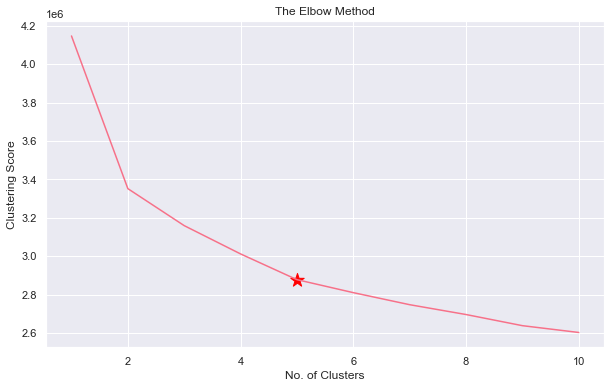

In [78]:
#finding the no of cluster using elbow method
clustering_score = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'random', random_state = 42)
    kmeans.fit(df_processed_3)
    clustering_score.append(kmeans.inertia_) # inertia_ = Sum of squared distances of samples to their closest cluster center.
    

plt.figure(figsize=(10,6))
plt.plot(range(1, 11), clustering_score)
plt.scatter(5,clustering_score[4], s = 200, c = 'red', marker='*')
plt.title('The Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('Clustering Score')
plt.show()

As per elbow method, the number of clusters to be set is 5.

In [80]:
Best_KMeans = KMeans(n_clusters = 5, init = 'random', random_state = 42)

In [81]:
cluster_no = Best_KMeans.fit_predict(df_processed_3)

In [82]:
len(df_processed_3)

109633

In [83]:
cluster_no_df = pd.DataFrame(cluster_no,columns = ['cluster_no'])

In [113]:
len(cluster_no_df)

109633

In [114]:
#merging cluster nos with the raw df
df_with_cluster_2 = pd.concat([df_raw,cluster_no_df],1)
df_with_cluster_2.head()

,order_status,customer_state,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_name_lenght,product_description_lenght,...,order_estimated_delivery_date_int_hour,order_estimated_delivery_date_is_weekday,order_estimated_delivery_date_is_weekend,shipping_limit_date_year,shipping_limit_date_month,shipping_limit_date_day,shipping_limit_date_int_hour,shipping_limit_date_is_weekday,shipping_limit_date_is_weekend,cluster_no
0,delivered,SP,29.99,8.72,1.0,credit_card,1.0,18.12,40.0,268.0,...,0.0,True,False,2017.0,10.0,6.0,11.0,True,False,3.0
1,delivered,SP,29.99,8.72,3.0,voucher,1.0,2.00,40.0,268.0,...,0.0,True,False,2017.0,10.0,6.0,11.0,True,False,3.0
2,delivered,SP,29.99,8.72,2.0,voucher,1.0,18.59,40.0,268.0,...,0.0,True,False,2017.0,10.0,6.0,11.0,True,False,3.0
3,delivered,SP,29.99,7.78,1.0,credit_card,3.0,37.77,40.0,268.0,...,0.0,False,False,2017.0,8.0,21.0,20.0,False,False,3.0
4,delivered,SP,29.99,7.78,1.0,credit_card,1.0,37.77,40.0,268.0,...,0.0,True,False,2017.0,8.0,8.0,18.0,True,False,3.0


In [120]:
df_with_cluster_2.cluster_no.value_counts()

3.0    30097
4.0    29614
2.0    26225
0.0    15532
1.0     4747
Name: cluster_no, dtype: int64

In [116]:
df_with_cluster_2.isna().any()

order_status                                True
customer_state                              True
price                                       True
freight_value                               True
payment_sequential                          True
payment_type                                True
payment_installments                        True
payment_value                               True
product_name_lenght                         True
product_description_lenght                  True
product_photos_qty                          True
product_weight_g                            True
product_length_cm                           True
product_height_cm                           True
product_width_cm                            True
seller_state                                True
order_purchase_timestamp_year               True
order_purchase_timestamp_month              True
order_purchase_timestamp_day                True
order_purchase_timestamp_int_hour           True
order_purchase_times

In [119]:
len(df_with_cluster_2)

106215

In [118]:
#dropping nans
df_with_cluster_2.dropna(axis=0,inplace=True)

<AxesSubplot:xlabel='cluster_no', ylabel='price'>

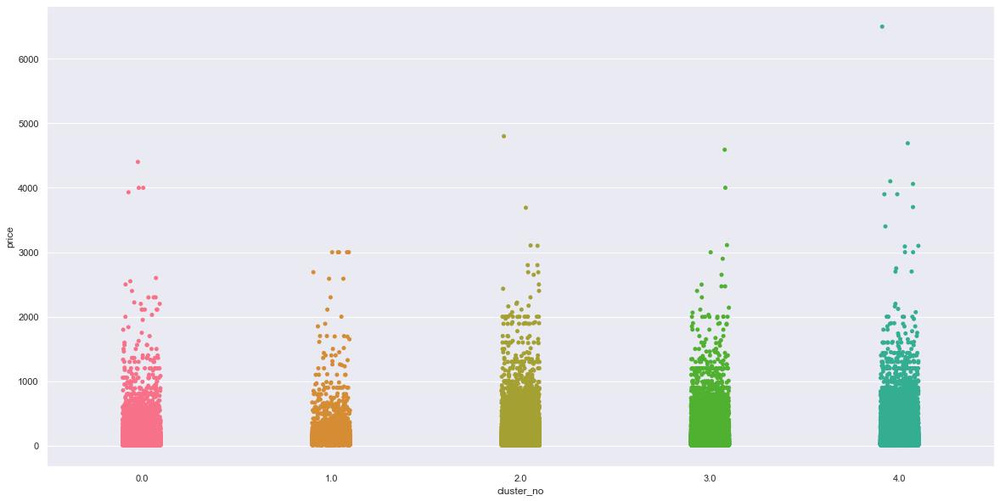

In [154]:
#no discernable difference in the price among the clusters
sns.stripplot(x="cluster_no", y="price", data=df_with_cluster_2)

/Users/krishnasreenivas/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning:

41.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/krishnasreenivas/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning:

42.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/krishnasreenivas/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning:

40.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



<AxesSubplot:xlabel='cluster_no', ylabel='order_purchase_timestamp_int_hour'>

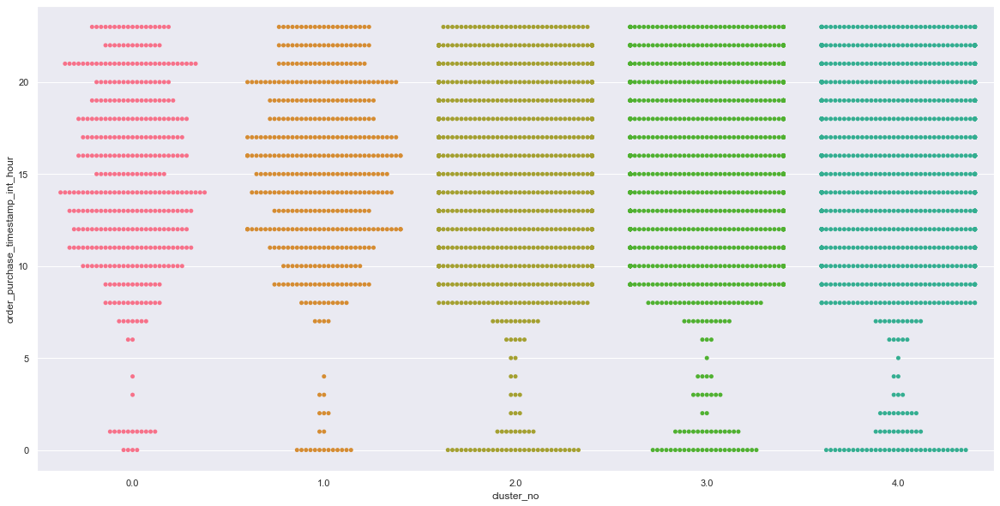

In [157]:
#not much differnece in order purchase hour either
sns.swarmplot(x="cluster_no", y="order_purchase_timestamp_int_hour", data=df_with_cluster_2[:4000])

<AxesSubplot:xlabel='cluster_no', ylabel='freight_value'>

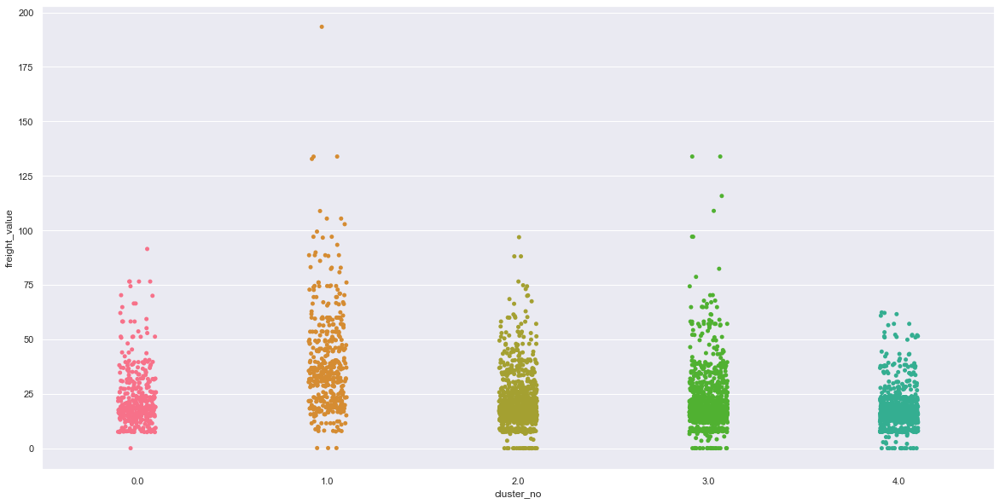

In [173]:
#minute differnecer in cluster1 concerning the freight value
sns.stripplot(x="cluster_no", y="freight_value", data=df_with_cluster_2[:4000])

In [165]:
temp_df = df_with_cluster_2[:4000]

<AxesSubplot:xlabel='count', ylabel='payment_type'>

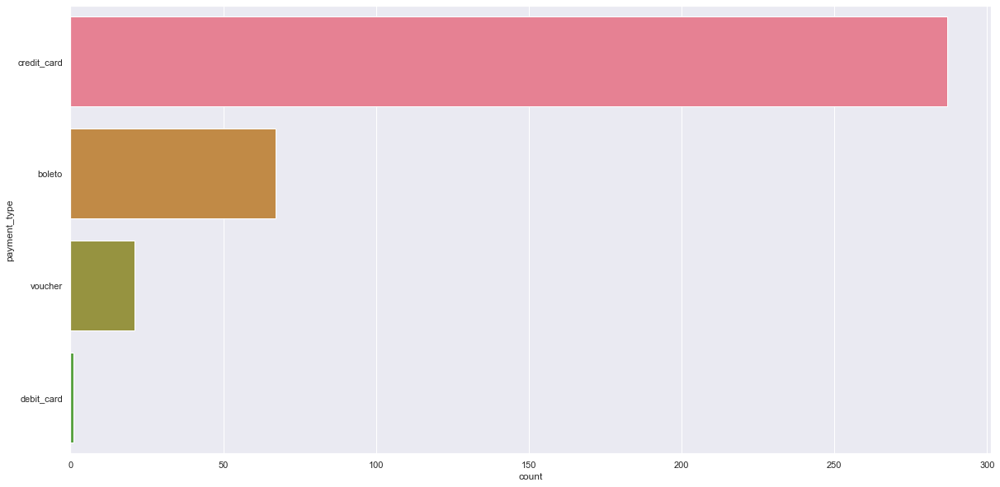

In [171]:
sns.countplot(y = 'payment_type',data=temp_df[temp_df['cluster_no'] == 0],order = temp_df['payment_type'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='payment_type'>

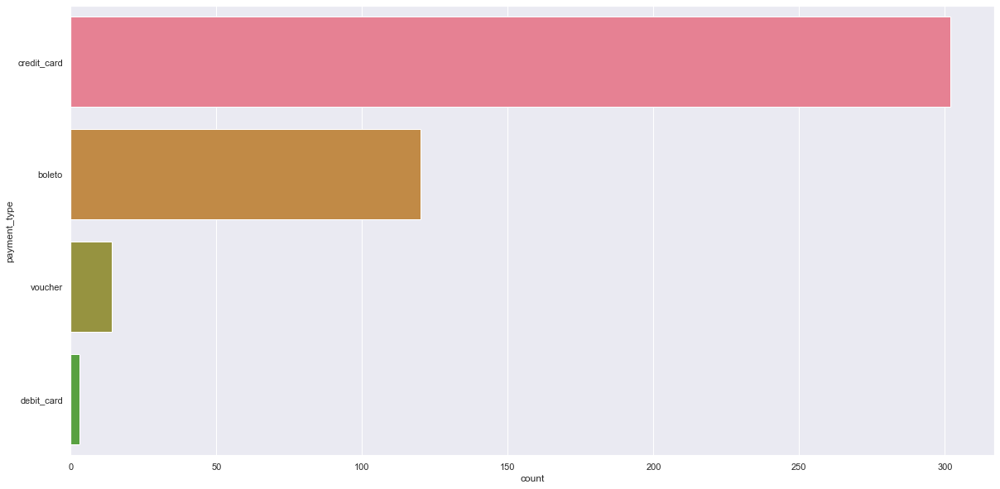

In [174]:
sns.countplot(y = 'payment_type',data=temp_df[temp_df['cluster_no'] == 1],order = temp_df['payment_type'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='payment_type'>

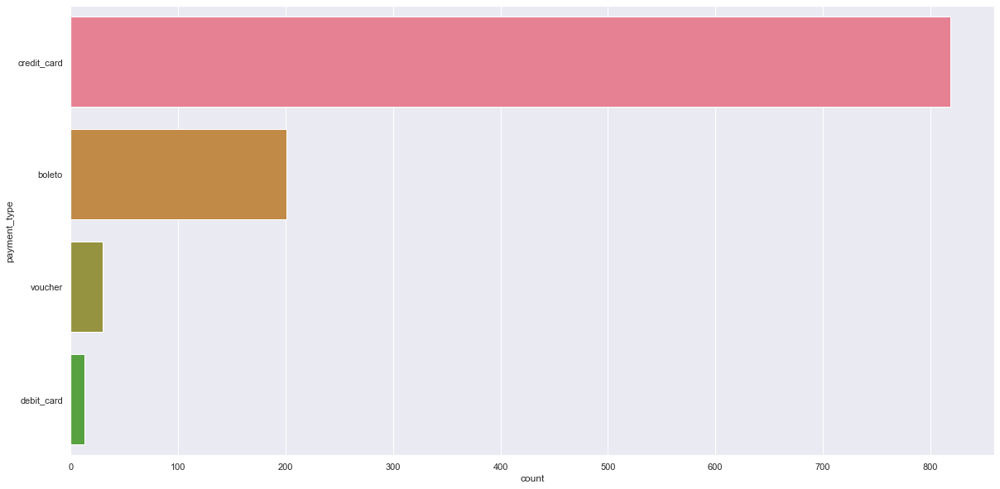

In [175]:
sns.countplot(y = 'payment_type',data=temp_df[temp_df['cluster_no'] == 2],order = temp_df['payment_type'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='payment_type'>

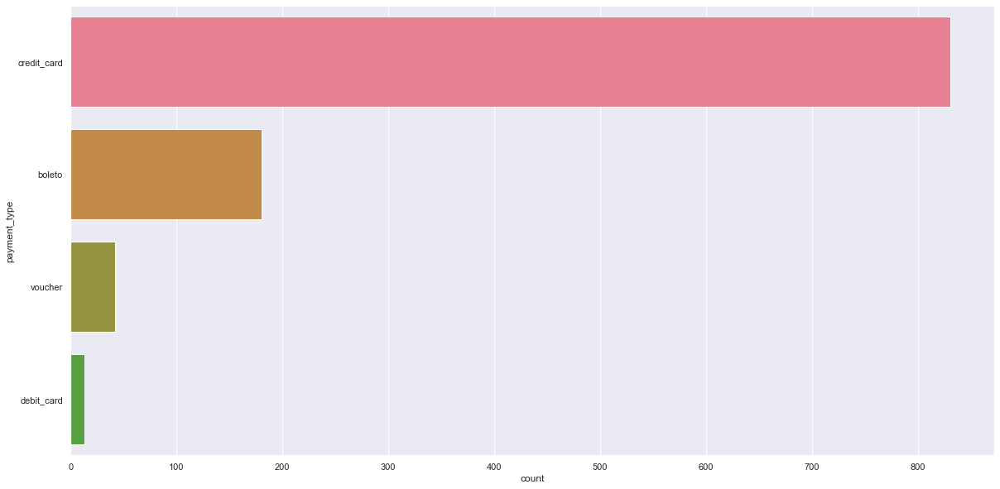

In [176]:
sns.countplot(y = 'payment_type',data=temp_df[temp_df['cluster_no'] == 3],order = temp_df['payment_type'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='payment_type'>

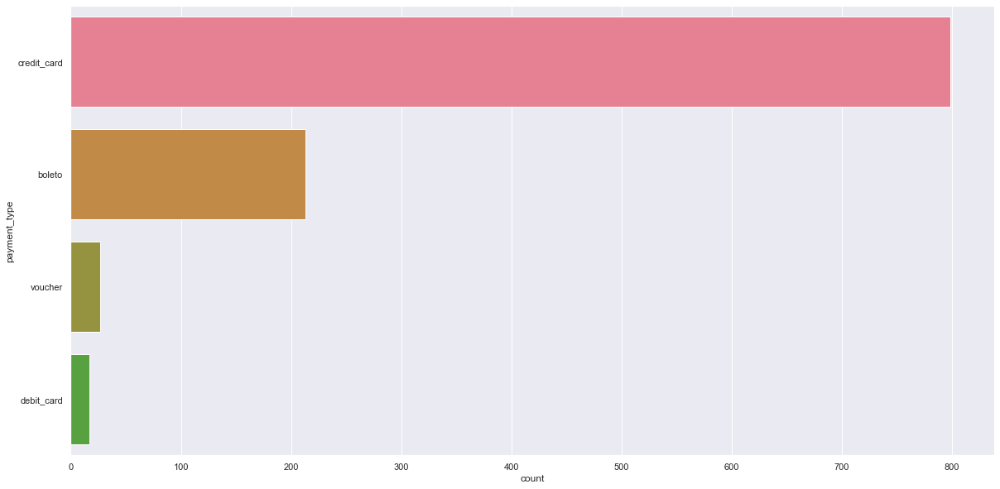

In [177]:
sns.countplot(y = 'payment_type',data=temp_df[temp_df['cluster_no'] == 4],order = temp_df['payment_type'].value_counts().index)

<AxesSubplot:xlabel='cluster_no', ylabel='payment_value'>

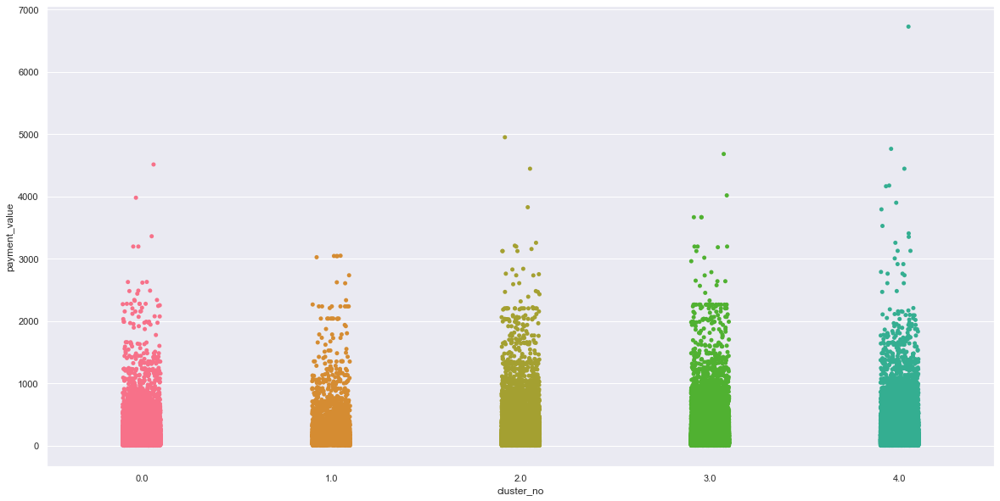

In [178]:
sns.stripplot(x="cluster_no", y="payment_value", data=df_with_cluster_2)

<AxesSubplot:xlabel='count', ylabel='seller_state'>

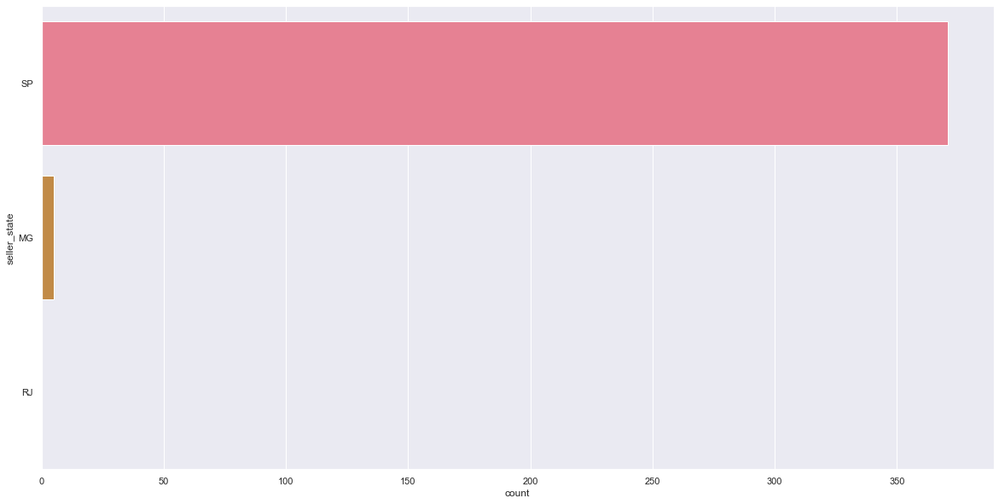

In [179]:
sns.countplot(y = 'seller_state',data=temp_df[temp_df['cluster_no'] == 0],order = temp_df['seller_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='seller_state'>

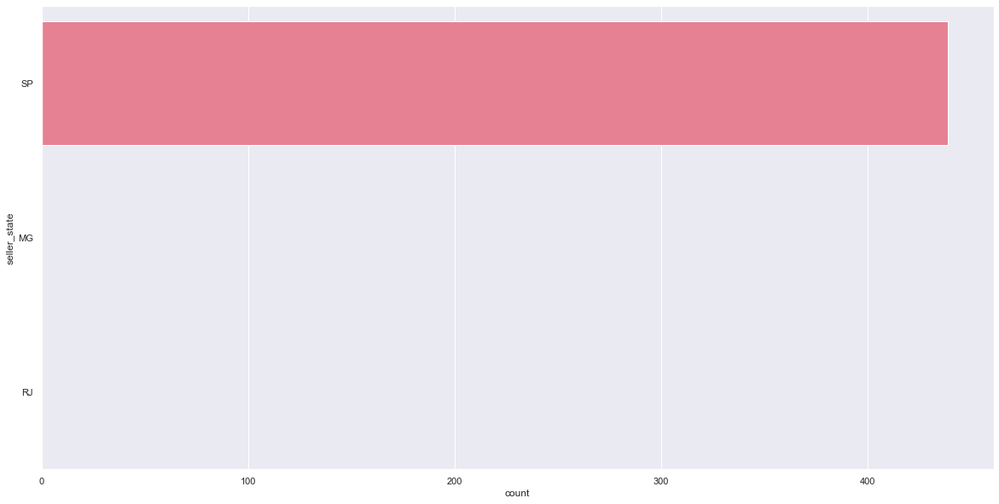

In [180]:
sns.countplot(y = 'seller_state',data=temp_df[temp_df['cluster_no'] == 1],order = temp_df['seller_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='seller_state'>

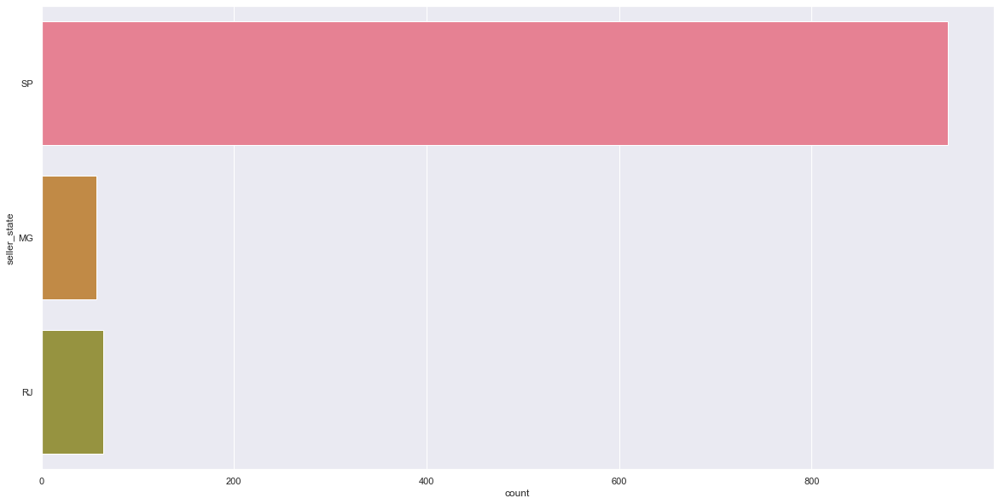

In [181]:
sns.countplot(y = 'seller_state',data=temp_df[temp_df['cluster_no'] == 2],order = temp_df['seller_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='seller_state'>

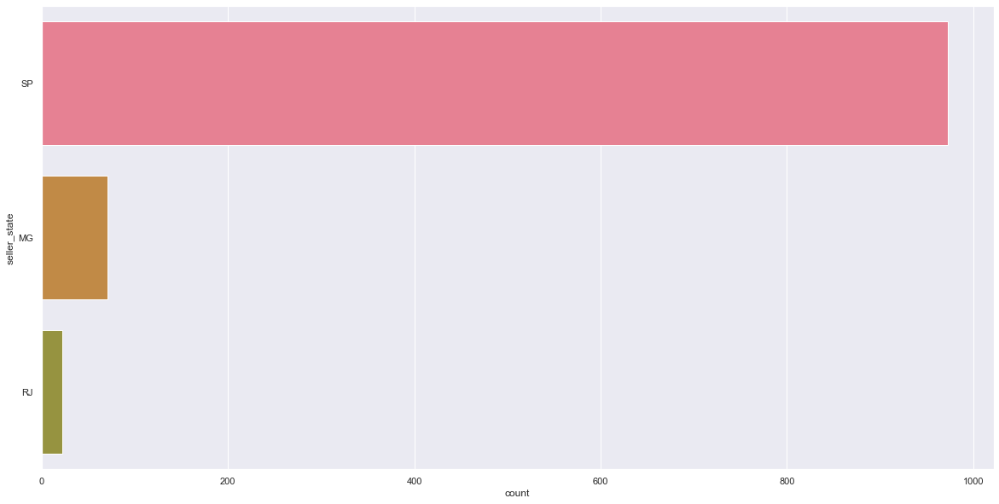

In [182]:
sns.countplot(y = 'seller_state',data=temp_df[temp_df['cluster_no'] == 3],order = temp_df['seller_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='seller_state'>

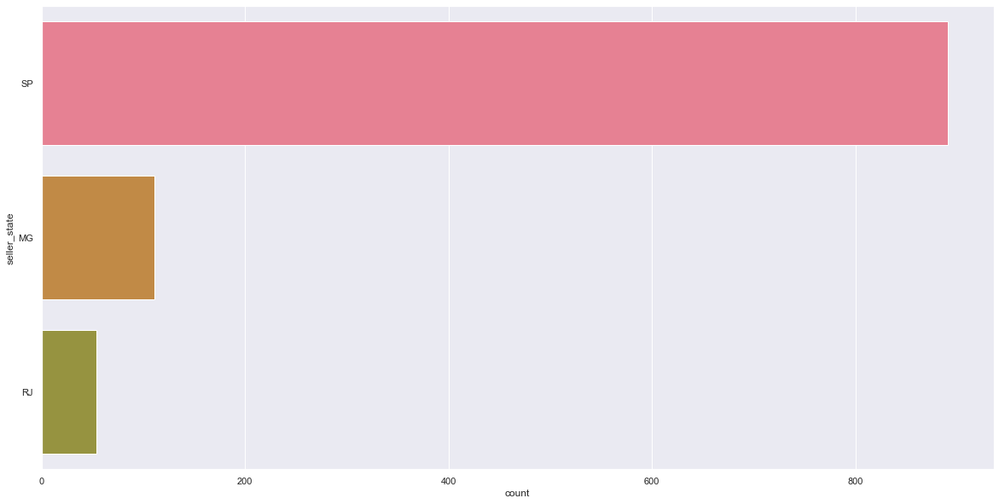

In [183]:
sns.countplot(y = 'seller_state',data=temp_df[temp_df['cluster_no'] == 4],order = temp_df['seller_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='customer_state'>

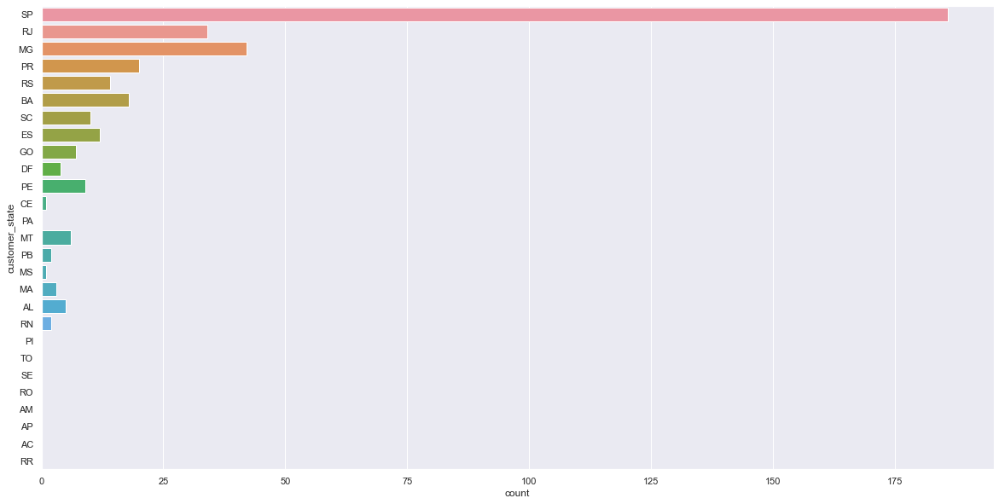

In [185]:
sns.countplot(y = 'customer_state',data=temp_df[temp_df['cluster_no'] == 0],order = temp_df['customer_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='customer_state'>

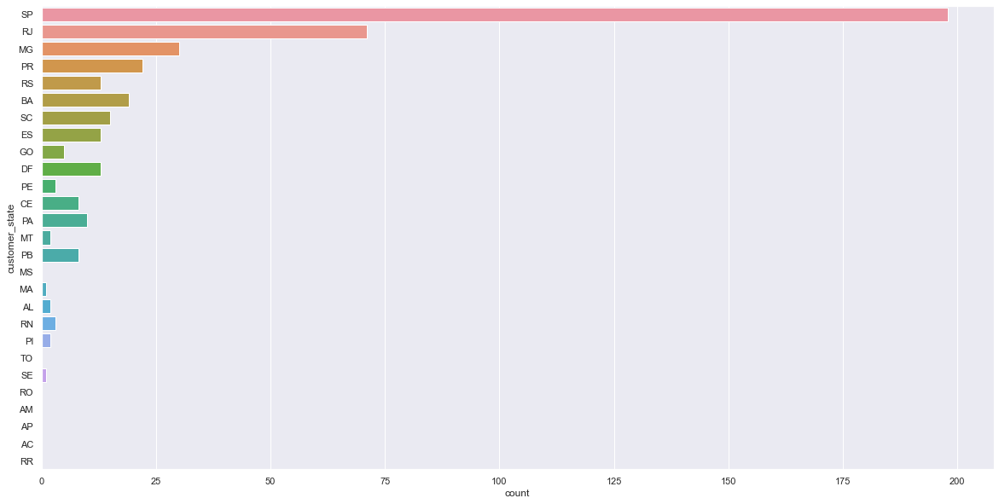

In [187]:
sns.countplot(y = 'customer_state',data=temp_df[temp_df['cluster_no'] == 1],order = temp_df['customer_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='customer_state'>

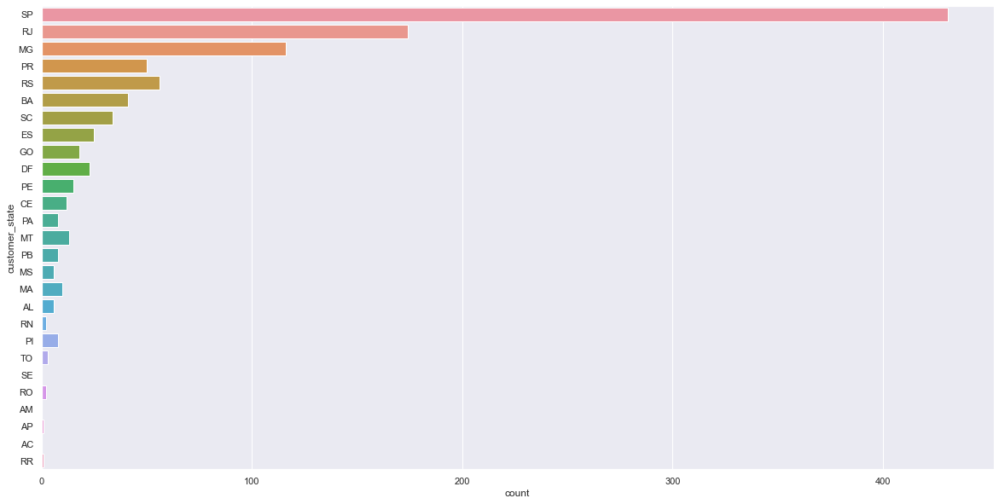

In [188]:
sns.countplot(y = 'customer_state',data=temp_df[temp_df['cluster_no'] == 2],order = temp_df['customer_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='customer_state'>

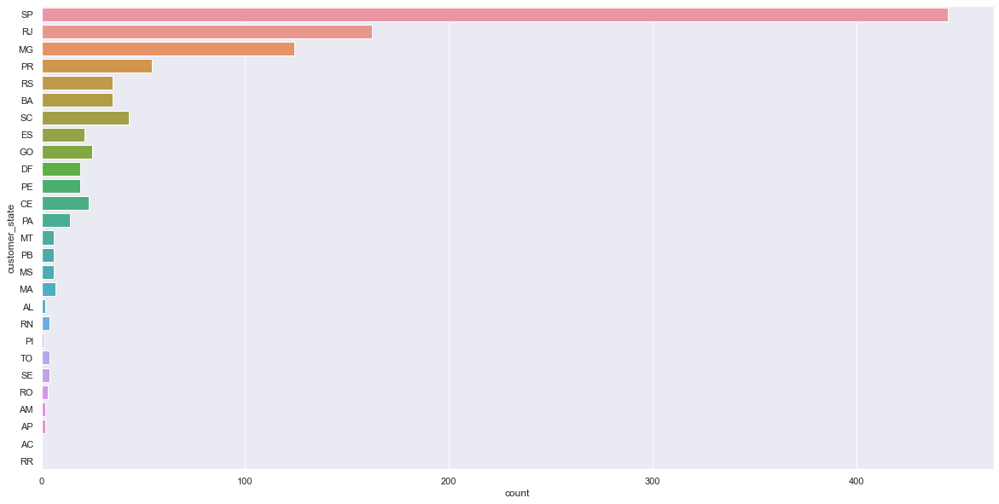

In [189]:
sns.countplot(y = 'customer_state',data=temp_df[temp_df['cluster_no'] == 3],order = temp_df['customer_state'].value_counts().index)

<AxesSubplot:xlabel='count', ylabel='customer_state'>

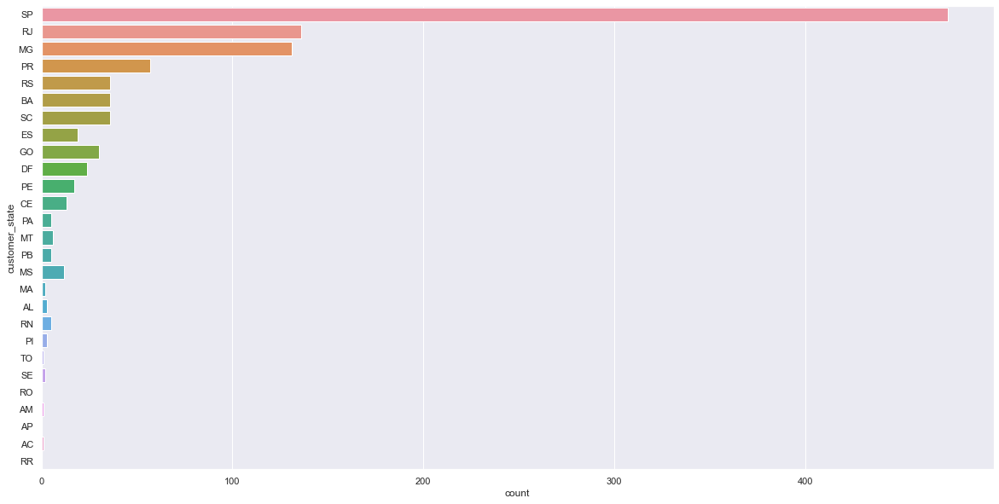

In [190]:
sns.countplot(y = 'customer_state',data=temp_df[temp_df['cluster_no'] == 4],order = temp_df['customer_state'].value_counts().index)

In [65]:
#dimensionality reduction through PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=3)

df_pca = pca.fit_transform(df_processed_3)
df_pca = pd.DataFrame(df_pca, columns=['pc1', 'pc2', 'pc3'])
print(pca.explained_variance_ratio_)

[0.22603211 0.0869163  0.07043576]


In [209]:
#finding the optimal epsilon_value and minimum_samples based on silhouette score
pca_eps_values = np.arange(0.5,1.2,0.1) 
pca_min_samples = np.arange(7,10) 
pca_dbscan_params = list(itertools.product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(df_pca)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_))-1)
    pca_sil_score.append(silhouette_score(df_pca, pca_dbscan_cluster.labels_))
pca_eps_min = list(zip(pca_no_of_clusters, pca_sil_score, pca_epsvalues, pca_min_samp))
pca_eps_min_df = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'silhouette_score', 'epsilon_values', 'minimum_points'])


In [75]:
pca_eps_min_df

,no_of_clusters,silhouette_score,epsilon_values,minimum_points
0,24,0.105142,0.4,7
1,17,0.123915,0.4,8
2,14,0.097707,0.4,9
3,21,0.143680,0.5,7
4,18,0.143753,0.5,8
5,14,0.134428,0.5,9
6,16,0.126891,0.6,7
7,16,0.110730,0.6,8
8,15,0.115945,0.6,9
9,10,0.149489,0.7,7


In [210]:
#fitting dbscan with 1.0 as epsilon and 9 as min_samples
db = DBSCAN(eps=1.0, min_samples=9).fit(df_pca)
labels = db.labels_
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % silhouette_score(df_pca, labels))

Estimated number of clusters: 4
Estimated number of noise points: 117
Silhouette Coefficient: 0.457


In [211]:
#3d scatter plot of dbscan clusters from PCA
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
labels = db.labels_
trace = go.Scatter3d(x=df_pca.iloc[:,0], y=df_pca.iloc[:,1], z=df_pca.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.update_layout(title='DBSCAN clusters (4) Derived from PCA', font=dict(size=12,))
fig.show()